<h1>Méthode suivie</h1>

Comme détaillé dans le rapport joint (livrable 1), nous allons suivre des traitements en cascade sur les planches de jeu "Où est Charlie ?" afin d'être en mesure de résoudre le jeu. 

<h3>Etape 1 : Réduction de l’espace de recherche par filtrage colorim´ etrique</h3>

Dans cette étape, nous allons réduire l'espace de recherche à l'aide d'un filtrage colorimétrique, en tirant profit de la signature visuelle forte de notre cible : Charlie (rayures rouges et blanches notamment). Nous allons commencer par convertir notre planche dans l'espace HSV pour séparer l'information chromatique de l'intensité lumineuse. Nous nettoierons ensuite le bruit de sorte à n'obtenir à l'issue de cette première étape qu'un masque bianire traduisant les ROI (Regions Of Interest).

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

planche_path = "./original-images/"
planche_file = planche_path + "19.jpg"

In [22]:
def pretraitement_planche(image_path):
    image = cv2.imread(image_path)
    if image is None:
        print("Erreur : Image introuvable.")
        return None, None, None
        
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # 1. Seuils HSV ajustés (Saturation à 60 pour être moins restrictif que 70)
    lower_red1 = np.array([0, 60, 50])
    upper_red1 = np.array([10, 255, 255])
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)

    lower_red2 = np.array([170, 60, 50])
    upper_red2 = np.array([179, 255, 255])
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)

    mask_red = cv2.bitwise_or(mask1, mask2)
    
    # 2. Nettoyage et morphologie
    kernel_ouverture = np.ones((3, 3), np.uint8)
    mask_base = cv2.morphologyEx(mask_red, cv2.MORPH_OPEN, kernel_ouverture)
    
    # On utilise un noyau vertical (18, 8) pour lier le bonnet au pull sans fusionner les voisins
    kernel_fermeture = np.ones((18, 8), np.uint8) 
    mask_base = cv2.morphologyEx(mask_base, cv2.MORPH_CLOSE, kernel_fermeture)

    # 3. Détection des contours
    contours, _ = cv2.findContours(mask_base, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    rois = []
    image_resultat = image.copy() 

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Filtre pour ignorer les petits bruits
        if w < 5 or h < 12:
            continue

        # 4. SOLUTION : Agrandissement manuel de la boîte (Padding)
        # On ajoute 20% de marge en largeur et 40% en hauteur pour capturer la tête
        pad_w = int(w * 0.2)
        pad_h = int(h * 0.4)
        
        x_new = max(0, x - pad_w)
        y_new = max(0, y - pad_h)
        w_new = min(image.shape[1] - x_new, w + 2 * pad_w)
        h_new = min(image.shape[0] - y_new, h + 2 * pad_h)
        
        rois.append((x_new, y_new, w_new, h_new))
        cv2.rectangle(image_resultat, (x_new, y_new), (x_new+w_new, y_new+h_new), (0, 255, 0), 2)

    return rois, mask_base, image_resultat

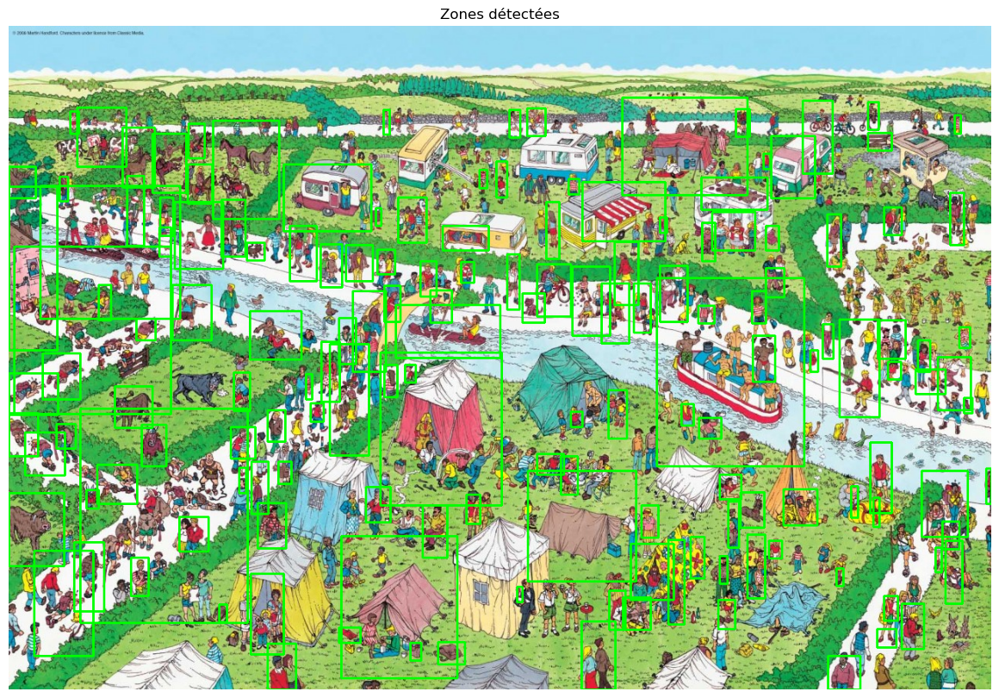

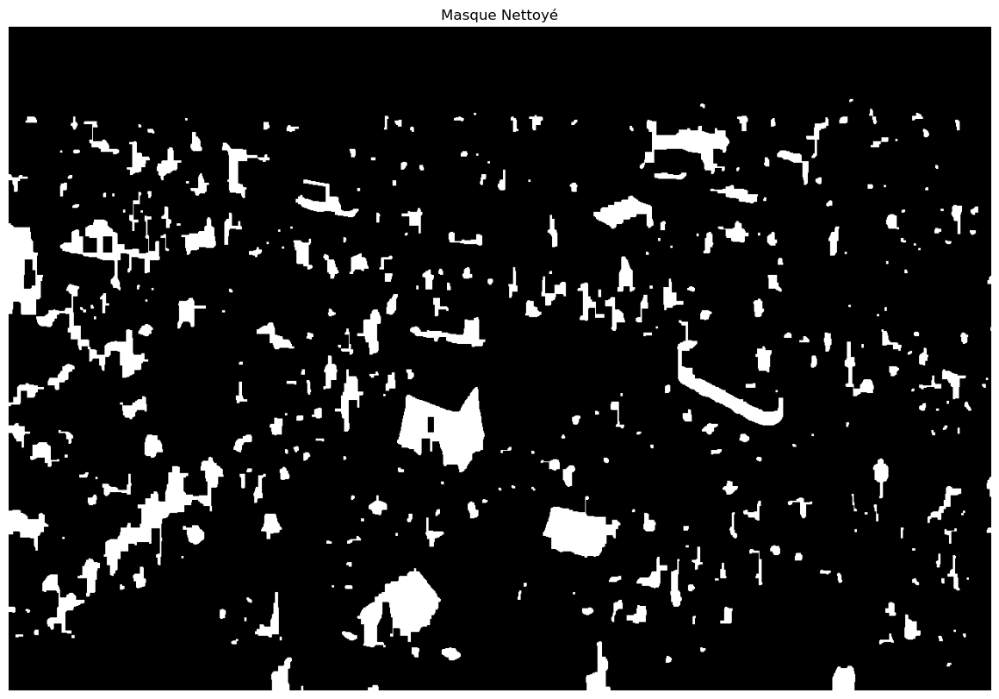

In [23]:
rois, mask, img_bbox = pretraitement_planche(planche_file)
img_rgb = cv2.cvtColor(img_bbox, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 10))
plt.imshow(img_rgb)
plt.title("Zones détectées")
plt.axis('off')
plt.show()

plt.figure(figsize=(15, 10))
plt.imshow(mask, cmap='gray')
plt.title("Masque Nettoyé")
plt.axis('off')
plt.show()

<h3>Etape 2 : Extraction de primitives locales</h3>

Sur les zones d'intérêt indentifiées à l'étape 1, nous allons maintenant appliquer l'algorithme SIFT pour obtenir les keypoints et leus descripteurs associés, afin de pouvoir comparer à notre base de référence d'images de Charlie, qui entrera en jeu dans l'étape suivante.

In [24]:
def extraire_sift_rois(image_bgr, rois):
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    
    # Création de l'objet CLAHE pour améliorer le contraste localement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

    sift_data = {}
    img_visualisation = image_bgr.copy()

    for (x, y, w, h) in rois:
        # 1. Extraction de la zone
        roi_gray = gray[y:y+h, x:x+w]
        if roi_gray.size == 0: continue
            
        # 2. Amélioration du contraste
        roi_enhanced = clahe.apply(roi_gray)
        
        # 3. Upscaling (x2) pour booster la détection sur les petites zones
        roi_resized = cv2.resize(roi_enhanced, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
        # 4. Détection et Description
        keypoints, descriptors = sift.detectAndCompute(roi_resized, None)

        if descriptors is not None and len(keypoints) > 0:
            # On remet les points à l'échelle originale (/2) et on ajoute l'offset global (+x, +y)
            for kp in keypoints:
                kp.pt = (kp.pt[0] / 2.0 + x, kp.pt[1] / 2.0 + y)
                
            sift_data[(x, y, w, h)] = {'keypoints': keypoints, 'descriptors': descriptors}
            
            # Visualisation des points riches
            img_visualisation = cv2.drawKeypoints(img_visualisation, keypoints, img_visualisation, 
                                                  flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    return sift_data, img_visualisation

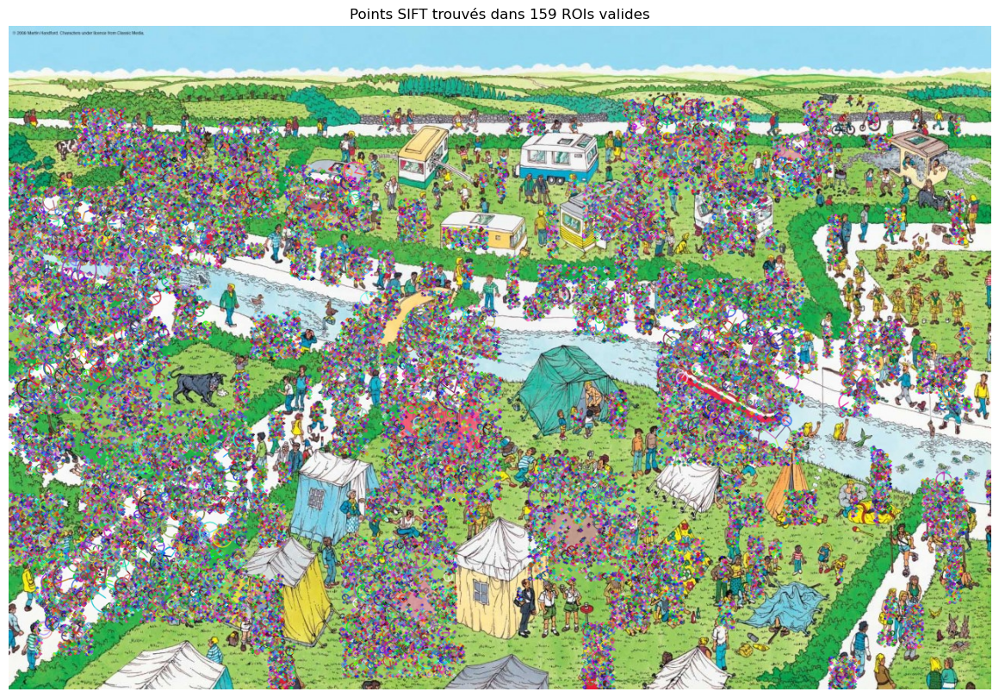

La première ROI possède une matrice de descripteurs de forme : (250, 128)


In [25]:
sift_data, img_sift = extraire_sift_rois(cv2.imread(planche_file), rois)

plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_sift, cv2.COLOR_BGR2RGB))
plt.title(f"Points SIFT trouvés dans {len(sift_data)} ROIs valides")
plt.axis('off')
plt.show()


premiere_roi = list(sift_data.keys())[0]
descripteurs = sift_data[premiere_roi]['descriptors']
print(f"La première ROI possède une matrice de descripteurs de forme : {descripteurs.shape}") 

<h3>Etape 3 : Construction du dictionnaire visuel et quantification (BoW)</h3>

L'objectif de cette étape est de transformer la multitude de points SIFT (des vecteurs de dimension 128) de notre image en une représentation simplifiée en utilisant l'approche Bag of Words. Pour cela, nous créons d'abord un dictionnaire de « mots visuels » en regroupant les descripteurs les plus représentatifs de nos images de référence de Charlie (disponibles dans le dossier ./data_bow) via l'algorithme K-Means. Ensuite, chaque ROI de la planche est convertie en un histogramme : on compte simplement combien de fois chaque mot du dictionnaire apparaît dans la zone. Cela permet de caractériser Charlie par sa "composition" visuelle (ex: forte proportion de mots typiques des rayures ou des lunettes) plutôt que par une comparaison pixel à pixel.

In [26]:
def construire_vocabulaire(dossier_references, k=100):
    """
    Crée le dictionnaire de 'mots visuels' (clusters) à partir des images de référence.
    """
    sift = cv2.SIFT_create()
    descripteurs_liste = []
    print(f"Extraction des descripteurs SIFT pour le vocabulaire (K={k})...")
    # Parcours des 21 images de Charlie
    filenames = sorted(os.listdir(dossier_references))
    for filename in filenames:
        path = os.path.join(dossier_references, filename)
        img = cv2.imread(path, 0) # Lecture en niveaux de gris
        if img is not None:
            img_res = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
            # Détection des points SIFT
            _, des = sift.detectAndCompute(img_res, None)
            if des is not None:
                descripteurs_liste.append(des)
        else:
            print(f"Alerte : Impossible de lire {filename}")
    if not descripteurs_liste:
        raise ValueError("Aucun descripteur trouvé. Vérifiez le chemin du dossier data_bow.")
    # Empiler tous les descripteurs pour le clustering
    tous_descripteurs = np.vstack(descripteurs_liste).astype(np.float32)
    print(f"Nombre total de descripteurs collectés : {len(tous_descripteurs)}")
    # Algorithme K-Means pour créer les 'mots visuels'
    print("Entraînement de K-Means (cela peut prendre quelques secondes)...")
    bow_trainer = cv2.BOWKMeansTrainer(k)
    vocabulaire = bow_trainer.cluster(tous_descripteurs)
    print("Dictionnaire visuel construit avec succès.")
    return vocabulaire

In [27]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def score_intersection(h_roi, h_ref):
    """ Calcule l'intersection : plus le score est haut, plus c'est similaire. """
    return np.sum(np.minimum(h_roi, h_ref))

def extraire_hists_robustes(img_bgr, descriptors, vocabulaire, flann):
    # --- Part 1: BoW avec Normalisation Hellinger ---
    bow_hist = np.zeros(len(vocabulaire), dtype=np.float32)
    if descriptors is not None and len(descriptors) > 0:
        matches = flann.knnMatch(descriptors.astype(np.float32), vocabulaire.astype(np.float32), k=1)
        for m in matches:
            bow_hist[m[0].trainIdx] += 1
        
        # Normalisation L1
        bow_hist /= (np.sum(bow_hist) + 1e-6)
        # Racine carrée (Hellinger) pour écraser les pics de fréquence trop hauts
        bow_hist = np.sqrt(bow_hist)
        
    # --- Part 2: Couleur HSV (Plus de bins pour plus de précision) ---
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    # 24 bins pour la teinte, 8 pour la saturation : très discriminant
    color_hist = cv2.calcHist([hsv], [0, 1], None, [24, 8], [0, 180, 0, 256])
    cv2.normalize(color_hist, color_hist, 0, 1, cv2.NORM_MINMAX)
    # On aplatit et on applique aussi la racine carrée
    color_hist = np.sqrt(color_hist.flatten())
    return bow_hist, color_hist

vocab = construire_vocabulaire("./data_bow/", k=200)

def preparer_signatures_robustes(dossier_refs, vocabulaire):
    sift = cv2.SIFT_create()
    flann = cv2.FlannBasedMatcher_create()
    refs_data = []
    
    for filename in sorted(os.listdir(dossier_refs)):
        img = cv2.imread(os.path.join(dossier_refs, filename))
        if img is not None:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            gray_res = cv2.resize(gray, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
            _, des = sift.detectAndCompute(gray_res, None)
            b_h, c_h = extraire_hists_robustes(img, des, vocabulaire, flann)
            refs_data.append({'bow': b_h, 'color': c_h})
    return refs_data

refs_data = preparer_signatures_robustes("./data_bow/", vocab)

def selectionner_suspects_robustes(image_planche, sift_data, vocabulaire, refs_data, n_top=60):
    flann = cv2.FlannBasedMatcher_create()
    scores_finaux = []
    
    for roi, data in sift_data.items():
        x, y, w, h = roi
        roi_img = image_planche[y:y+h, x:x+w]
        # Extraction ROI
        b_roi, c_roi = extraire_hists_robustes(roi_img, data['descriptors'], vocabulaire, flann)
        # On cherche la similarité maximale
        max_sim = 0
        for ref in refs_data:
            # Score combiné (intersection) 
            sim_bow = score_intersection(b_roi, ref['bow'])
            sim_color = score_intersection(c_roi, ref['color'])
            # Score hybride (pondération 50/50)
            sim_totale = 0.8 * sim_bow + 0.2 * sim_color
            if sim_totale > max_sim:
                max_sim = sim_totale
        scores_finaux.append((roi, max_sim))
    
    return sorted(scores_finaux, key=lambda x: x[1], reverse=True)[:n_top]

img_planche = cv2.imread(planche_file)
meilleurs_suspects = selectionner_suspects_robustes(img_planche, sift_data, vocab, refs_data, n_top=60)

print(f"Top 1 score : {meilleurs_suspects[0][1]:.4f}")

Extraction des descripteurs SIFT pour le vocabulaire (K=200)...
Alerte : Impossible de lire .DS_Store
Nombre total de descripteurs collectés : 15219
Entraînement de K-Means (cela peut prendre quelques secondes)...
Dictionnaire visuel construit avec succès.
Top 1 score : 14.5889


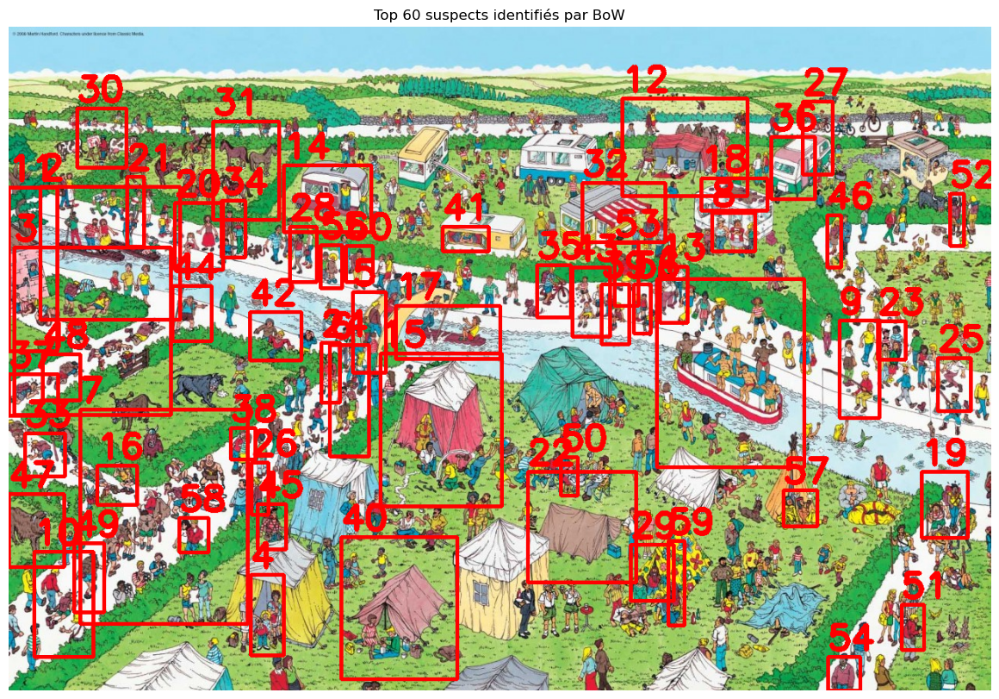

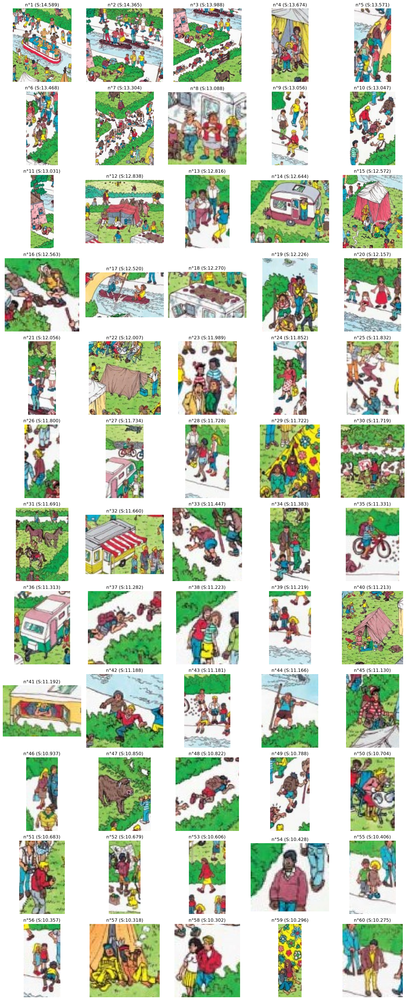

In [28]:
def visualiser_suspects_bow(image_planche_path, meilleurs_suspects):
    img_originale = cv2.imread(image_planche_path)
    img_rgb = cv2.cvtColor(img_originale, cv2.COLOR_BGR2RGB)
    # 1. Dessiner les boîtes sur l'image complète
    img_boxes = img_rgb.copy()
    for i, (roi, score) in enumerate(meilleurs_suspects):
        x, y, w, h = roi
        cv2.rectangle(img_boxes, (x, y), (x+w, y+h), (255, 0, 0), 4)
        cv2.putText(img_boxes, str(i+1), (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 5)
    # Affichage de la planche complète
    plt.figure(figsize=(15, 10))
    plt.imshow(img_boxes)
    plt.title(f"Top {len(meilleurs_suspects)} suspects identifiés par BoW")
    plt.axis('off')
    plt.show()
    # 2. Créer une mosaïque de zooms
    n_cols = 5
    n_rows = (len(meilleurs_suspects) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows*3))
    axes = axes.flatten()
    for i, (roi, score) in enumerate(meilleurs_suspects):
        x, y, w, h = roi
        # On ajoute une petite marge pour le contexte du zoom
        pad = 10
        y1, y2 = max(0, y-pad), min(img_rgb.shape[0], y+h+pad)
        x1, x2 = max(0, x-pad), min(img_rgb.shape[1], x+w+pad)     
        crop = img_rgb[y1:y2, x1:x2]
        axes[i].imshow(crop)
        axes[i].set_title(f"n°{i+1} (S:{score:.3f})")
        axes[i].axis('off')
    # Cacher les subplots vides
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()

# --- LANCEMENT ---
visualiser_suspects_bow(planche_file, meilleurs_suspects)

<h3>Etape 4 : Mise en correspondance et vérification géométrique (RANSAC)</h3>

L'objectif de cette étape est de valider lequel de nos meilleurs suspects possède la structure géométrique exacte de Charlie. Pour cela, nous allons utiliser l'algorithme RANSAC pour calculer une homographie, c'est-à-dire une transformation mathématique capable de projeter notre modèle de référence sur la planche en gérant les changements d'échelle, les rotations et les inclinaisons. Si un nombre suffisant de points s'alignent parfaitement selon cette transformation, nous considérons que Charlie est localisé.

In [29]:
import cv2
import numpy as np
import os

def valider_geometrie_ultime(meilleurs_suspects, dossier_refs, image_planche_path):
    # Initialisation : AKAZE est excellent pour les motifs de traits (dessins)
    detector = cv2.AKAZE_create()
    # On utilise NORM_HAMMING pour AKAZE (descripteurs binaires)
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_BRUTEFORCE_HAMMING)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    
    # 1. Préparation des modèles avec Upscaling x3
    modeles_db = []
    for i in range(1, 22):
        path = os.path.join(dossier_refs, f"{i}.png")
        img = cv2.imread(path, 0)
        if img is not None:
            img = cv2.resize(img, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
            img = clahe.apply(img)
            kp, des = detector.detectAndCompute(img, None)
            if des is not None:
                modeles_db.append({'kp': kp, 'des': des, 'shape': img.shape, 'id': i})

    image_originale = cv2.imread(image_planche_path)
    resultats_valides = []

    print(f"Analyse structurelle des {len(meilleurs_suspects)} suspects...")

    for rank, (roi, score_bow) in enumerate(meilleurs_suspects):
        x, y, w, h = roi
        pad = 20
        y1, y2 = max(0, y-pad), min(image_originale.shape[0], y+h+pad)
        x1, x2 = max(0, x-pad), min(image_originale.shape[1], x+w+pad)
        
        roi_img_bgr = image_originale[y1:y2, x1:x2]
        roi_img_gray = cv2.cvtColor(roi_img_bgr, cv2.COLOR_BGR2GRAY)
        
        # Prétraitement ROI
        roi_img_gray = cv2.resize(roi_img_gray, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
        roi_img_gray = clahe.apply(roi_img_gray)
        
        kp_roi, des_roi = detector.detectAndCompute(roi_img_gray, None)
        if des_roi is None: continue

        best_roi_score = 0
        best_roi_data = None

        for mod in modeles_db:
            # On utilise le Ratio Test de Lowe très strict (0.7) pour éliminer le bruit de la foule
            matches = matcher.knnMatch(mod['des'], des_roi, k=2)
            good = [m for m, n in matches if m.distance < 0.7 * n.distance]

            if len(good) >= 4:
                src_pts = np.float32([mod['kp'][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
                dst_pts = np.float32([kp_roi[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
                
                # RANSAC avec un seuil de reprojection fin (3.0)
                M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 3.0)
                
                if M is not None:
                    inliers = np.sum(mask)
                    # --- FILTRE DE COHÉRENCE GÉOMÉTRIQUE ---
                    # On vérifie que le changement d'échelle est raisonnable (autour de 1.0 car on a upscalé les deux)
                    sc_x = np.sqrt(M[0,0]**2 + M[1,0]**2)
                    sc_y = np.sqrt(M[0,1]**2 + M[1,1]**2)
                    
                    # Si l'échelle est aberrante (Charlie ne peut pas être 5x plus petit que le modèle), on ignore
                    if 0.5 < sc_x < 2.0 and 0.5 < sc_y < 2.0:
                        # Score de confiance basé sur la densité des inliers
                        # (inliers au carré pour favoriser les "vrais" groupes structurés)
                        confiance = (inliers ** 2) / len(good)
                        
                        if confiance > best_roi_score:
                            best_roi_score = confiance
                            best_roi_data = (M, mod['shape'], mod['id'], inliers)

        if best_roi_data:
            resultats_valides.append({
                'roi': (x1, y1, x2-x1, y2-y1),
                'roi_bgr': roi_img_bgr, # On garde l'image pour l'étape 5
                'score_geometrique': best_roi_score,
                'inliers': best_roi_data[3],
                'homographie': best_roi_data[0],
                'model_shape': best_roi_data[1],
                'rank_bow': rank + 1
            })

    return sorted(resultats_valides, key=lambda x: x['score_geometrique'], reverse=True)
# --- EXECUTION ---
charlie_identifie = valider_geometrie_ultime(meilleurs_suspects, "./data_bow/", planche_file)

for i in range(5):
    top = charlie_identifie[i]
    print(f"Suspect top {i} issu du rang BoW n°{top['rank_bow']}")

Analyse structurelle des 60 suspects...
Suspect top 0 issu du rang BoW n°4
Suspect top 1 issu du rang BoW n°39
Suspect top 2 issu du rang BoW n°52
Suspect top 3 issu du rang BoW n°56
Suspect top 4 issu du rang BoW n°11


<h3> Étape 5 : Raffinement par analyse de texture et segmentation locale </h3>

Enfin, pour parfaire la détection et éliminer tout risque de faux positif (exemple : un objet rayé rouge et blanc qui ne serait pas Charlie), nous ajoutons une étape de validation de texture. Cette phase repose sur l'analyse des fréquences spatiales : le pull de Charlie présente une alternance régulière de fortes transitions d'intensité. En utilisant le filtre de Canny, nous extrayons les contours au sein de la zone détectée. Si la densité et l'orientation des contours correspondent à la signature fréquentielle des rayures, la détection est définitivement validée.

Raffinement final sur 10 suspects...
Candidat 1 (BoW n°4) : Score Final=1523.7
Candidat 2 (BoW n°39) : Score Final=922.9
Candidat 3 (BoW n°52) : Score Final=1532.6
Candidat 4 (BoW n°56) : Score Final=1041.2
Candidat 5 (BoW n°11) : Score Final=948.2
Candidat 6 (BoW n°23) : Score Final=1643.9
Candidat 7 (BoW n°30) : Score Final=1348.1
Candidat 8 (BoW n°12) : Score Final=763.3
Candidat 9 (BoW n°19) : Score Final=678.8
Candidat 10 (BoW n°28) : Score Final=645.6

CHARLIE TROUVÉ ! (Suspect BoW n°23 | X=1112, Y=363)


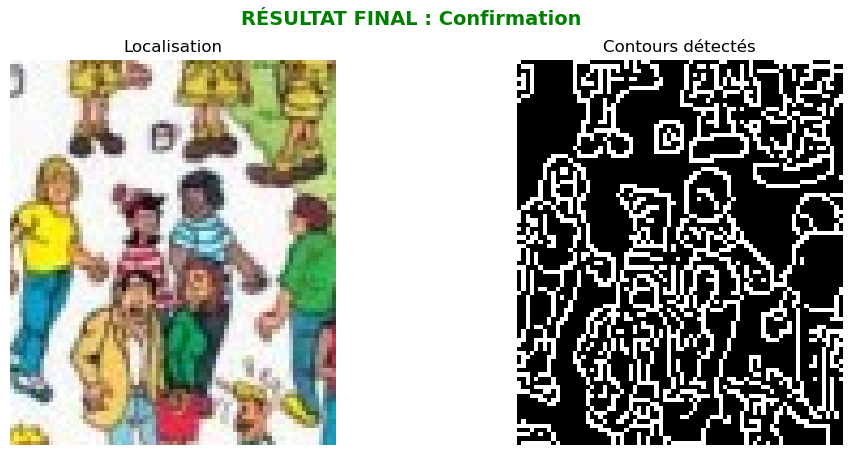

In [30]:
def identification_finale_expert(resultats_geometriques, nb_candidats_a_tester=10):
    if not resultats_geometriques:
        print("Aucun candidat à analyser.")
        return

    print(f"Raffinement final sur {min(len(resultats_geometriques), nb_candidats_a_tester)} suspects...")
    scores_finaux = []

    for i, res in enumerate(resultats_geometriques[:nb_candidats_a_tester]):
        crop = res['roi_bgr']
        h, w = crop.shape[:2]
        
        # 1. Détection des rayures horizontales (Sobel Y)
        gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        score_rayures = np.mean(np.absolute(sobely))
        
        # 2. Présence du bleu (pantalon) et du beige (peau)
        hsv = cv2.cvtColor(crop, cv2.COLOR_BGR2HSV)
        mask_bleu = cv2.inRange(hsv, np.array([100, 50, 50]), np.array([130, 255, 255]))
        mask_peau = cv2.inRange(hsv, np.array([0, 20, 100]), np.array([30, 150, 255]))
        presence_couleurs = (np.sum(mask_bleu > 0) + np.sum(mask_peau > 0)) / (h * w)
        
        # 3. Densité des traits (Canny)
        edges = cv2.Canny(gray, 100, 200)
        densite_details = np.sum(edges > 0) / (h * w)

        # Calcul du score final combiné
        score_final = res['score_geometrique'] * score_rayures * (1 + 10 * presence_couleurs) * (1 + densite_details)
        
        scores_finaux.append({
            'res_geo': res, 'score_final': score_final,
            'crop': crop, 'edges': edges
        })
        
        print(f"Candidat {i+1} (BoW n°{res['rank_bow']}) : Score Final={score_final:.1f}")

    # Désignation du vainqueur
    scores_finaux.sort(key=lambda x: x['score_final'], reverse=True)
    gagnant = scores_finaux[0]
    res_g = gagnant['res_geo']
    x, y, _, _ = res_g['roi']
    
    # Affichage des résultats
    print(f"\nCHARLIE TROUVÉ ! (Suspect BoW n°{res_g['rank_bow']} | X={x}, Y={y})")

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(gagnant['crop'], cv2.COLOR_BGR2RGB))
    plt.title("Localisation")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(gagnant['edges'], cmap='gray')
    plt.title("Contours détectés")
    plt.axis('off')
    
    plt.suptitle("RÉSULTAT FINAL : Confirmation", fontsize=14, fontweight='bold', color='green')
    plt.show()

    return res_g

# Lancement
charlie_final = identification_finale_expert(charlie_identifie)